<a href="https://colab.research.google.com/github/tzehrat/ARPPing/blob/main/InstanceSegmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 14995, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 14995 (delta 2), reused 1 (delta 0), pack-reused 14989
Receiving objects: 100% (14995/14995), 14.02 MiB | 19.82 MiB/s, done.
Resolving deltas: 100% (10296/10296), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.0/184.0 KB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 52.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 KB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.5/138.5 KB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 7.3 MB/s eta 0:00:00
Setup complete. Using torch 1.13.0+cu116 

In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="8TsWw6j2j8J77rX3o6ZY")
project = rf.workspace("ztas-g9jbu").project("kedikopekkus")
dataset = project.version(2).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/KediKopekKus-2 in yolov5pytorch:: 100%|██████████| 582/582 [00:00<00:00, 2234.92it/s]


# Yeni Bölüm

In [ ]:
!python train.py --img 416 --batch 16 --epochs 250 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/KediKopekKus-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=250, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-71-gc442a2e Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h

In [ ]:

%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images




detect: weights=['runs/train/exp/weights/best.pt'], source=/mmmm.jpeg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-71-gc442a2e Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /mmmm.jpeg: 288x416 1 kus, 13.0ms
Speed: 0.3ms pre-process, 13.0ms inference, 1.5ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp3


# Yeni Bölüm

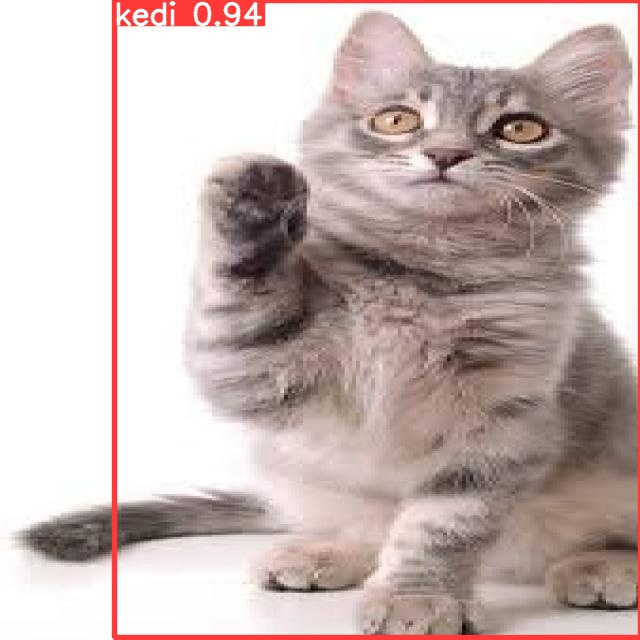

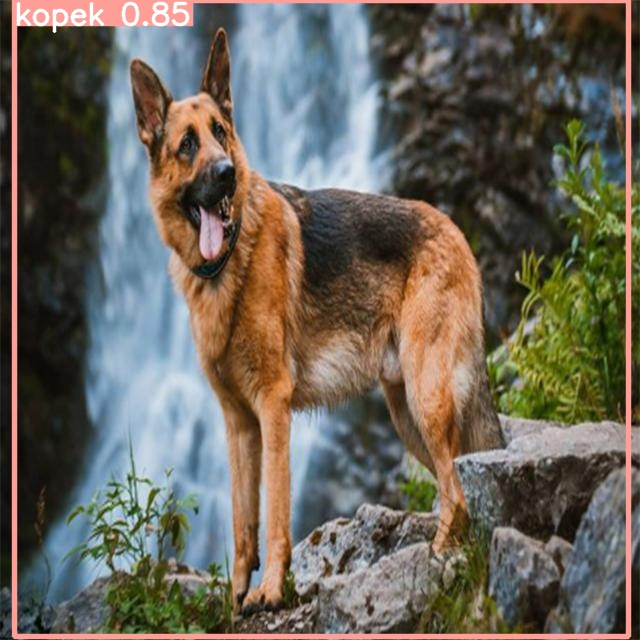

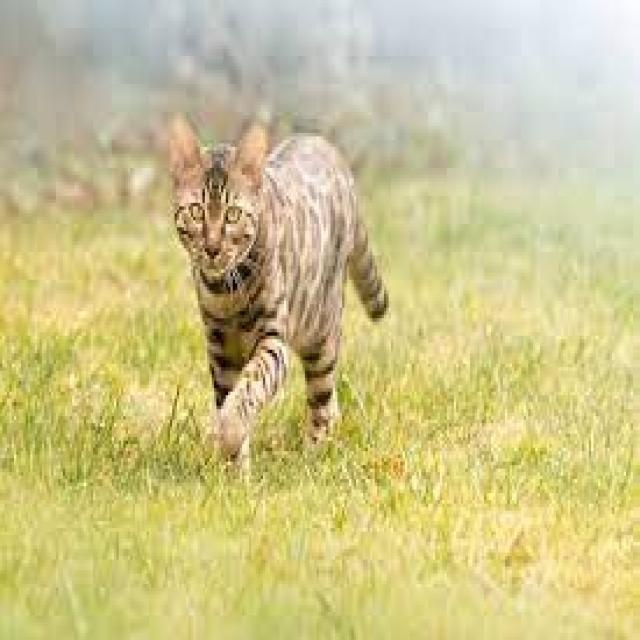

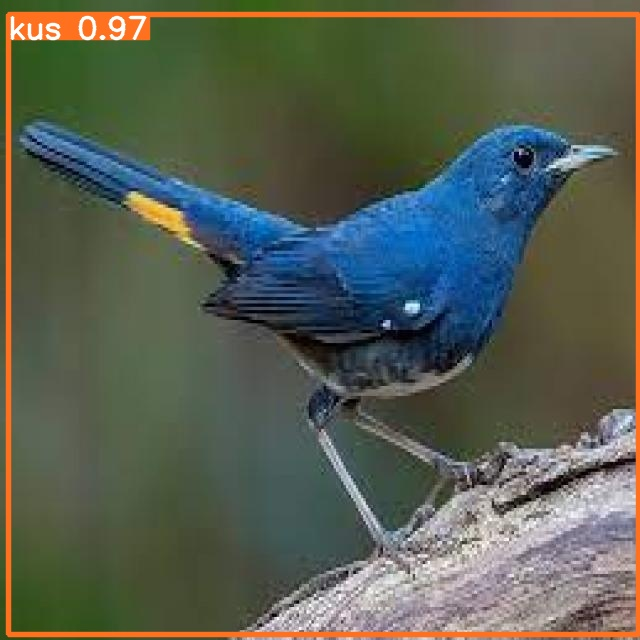

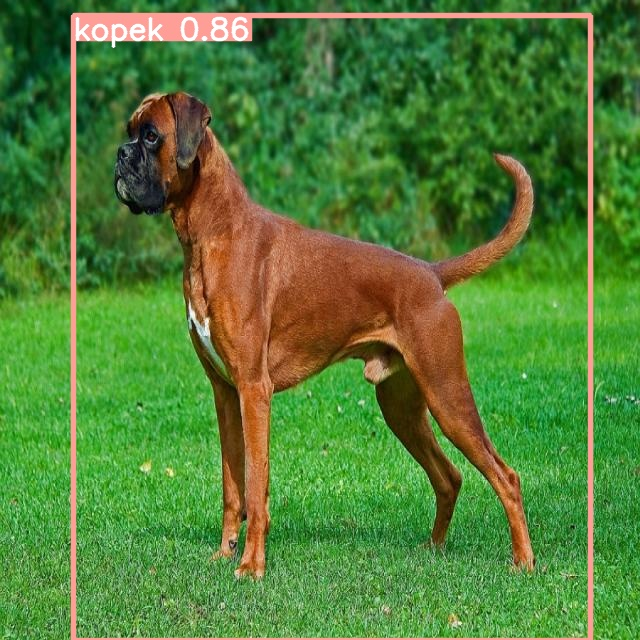

...

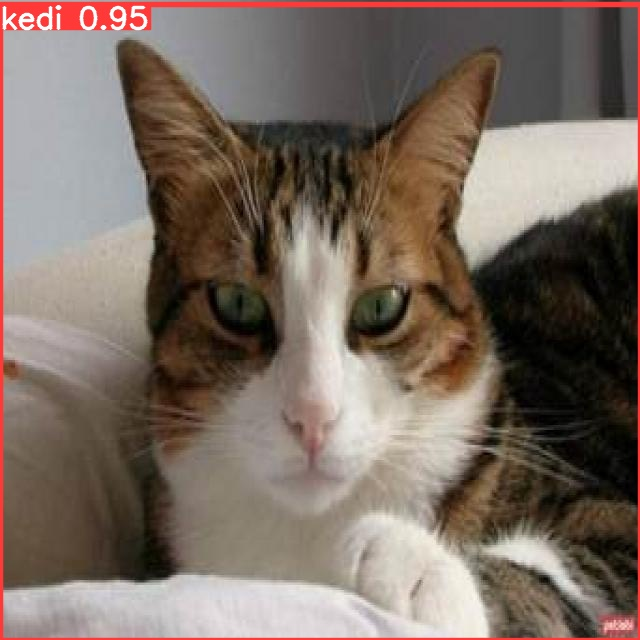

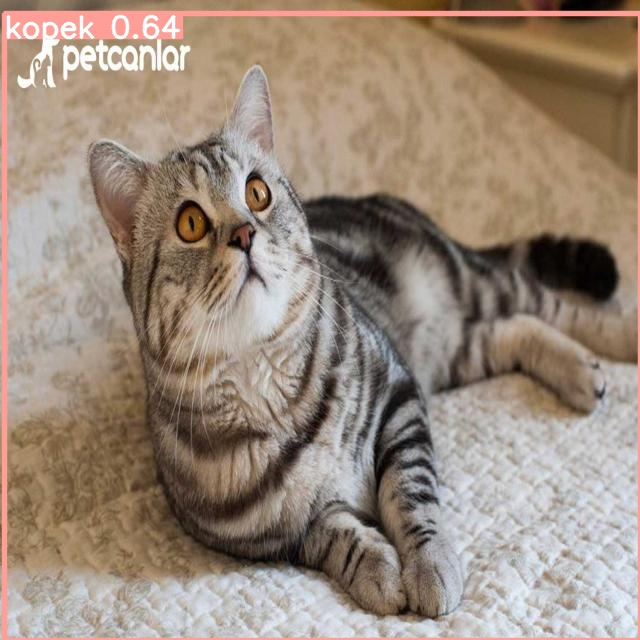

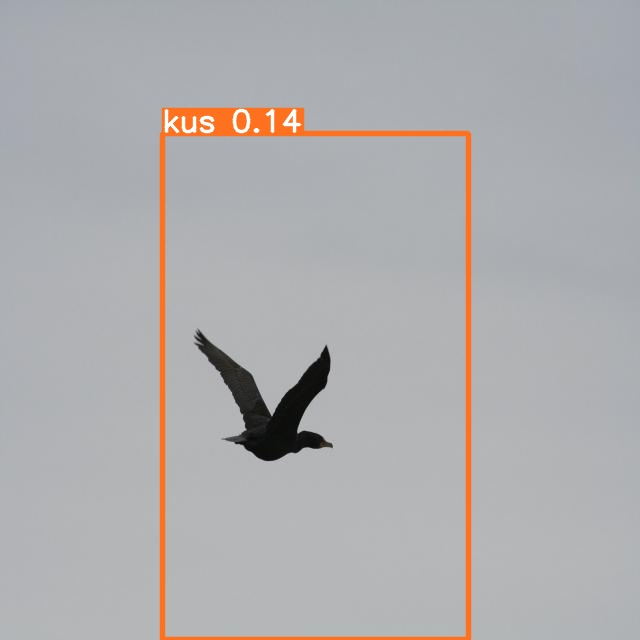

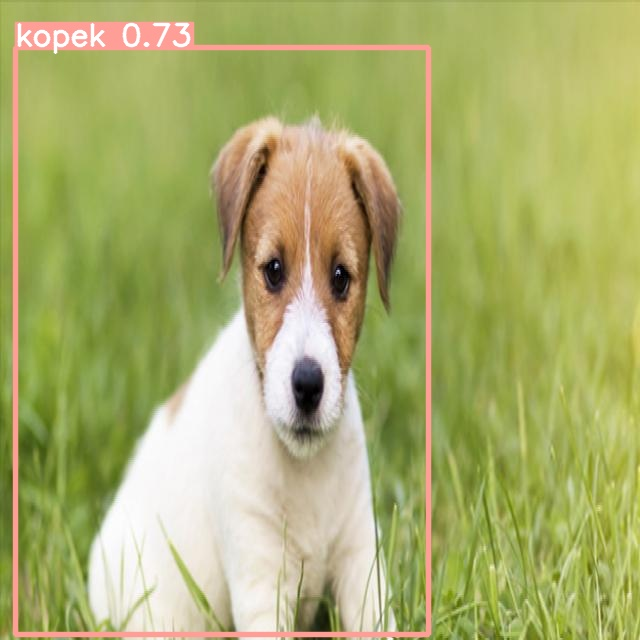

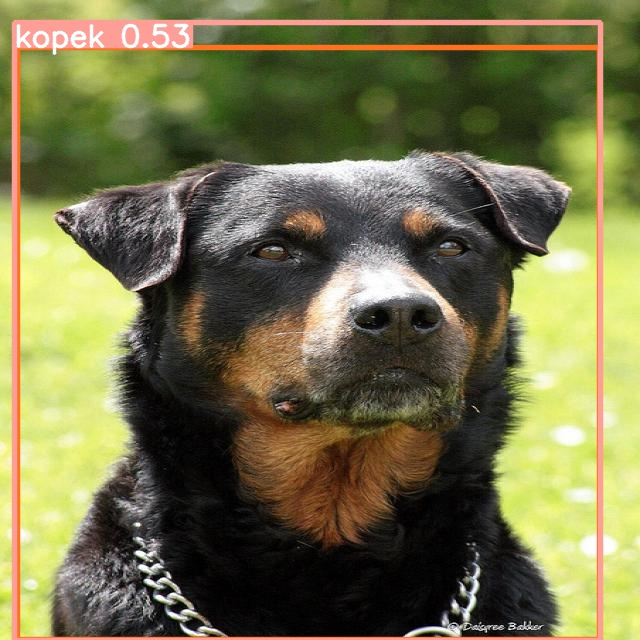

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kedi1.jpeg

!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kedi2.jpg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kedi3.jpg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kedi4.jpeg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kedi5.jpg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kopek1.jpeg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kopek2.jpeg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kopek3.jpg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kopek4.jpg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kopek5.jpg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kus1.jpg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kus2.jpg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kus3.jpg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kus4.jpg
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source  /kus5.jpeg






detect: weights=['runs/train/exp/weights/best.pt'], source=/kedi1.jpeg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-71-gc442a2e Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /kedi1.jpeg: 288x416 1 kedi, 12.1ms
Speed: 0.3ms pre-process, 12.1ms inference, 1.4ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp2
detect: weights=['runs/train/exp/weights/best.pt'], source=/kedi2.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, sa

In [ ]:
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')